In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [2]:
df = pd.read_csv("medical_students_dataset.csv")
pd.set_option("display.max_columns",None)

In [3]:
df.head()

,Student ID,Age,Gender,Height,Weight,Blood Type,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Diabetes,Smoking
0,1.0,18.0,Female,161.777924,72.354947,O,27.645835,NaN,95.0,109.0,203.0,No,NaN
1,2.0,NaN,Male,152.069157,47.630941,B,NaN,98.714977,93.0,104.0,163.0,No,No
2,3.0,32.0,Female,182.537664,55.741083,A,16.729017,98.260293,76.0,130.0,216.0,Yes,No
3,NaN,30.0,Male,182.112867,63.332207,B,19.096042,98.839605,99.0,112.0,141.0,No,Yes
4,5.0,23.0,Female,NaN,46.234173,O,NaN,98.480008,95.0,NaN,231.0,No,No


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Student ID      180000 non-null  float64
 1   Age             180000 non-null  float64
 2   Gender          180000 non-null  object 
 3   Height          180000 non-null  float64
 4   Weight          180000 non-null  float64
 5   Blood Type      180000 non-null  object 
 6   BMI             180000 non-null  float64
 7   Temperature     180000 non-null  float64
 8   Heart Rate      180000 non-null  float64
 9   Blood Pressure  180000 non-null  float64
 10  Cholesterol     180000 non-null  float64
 11  Diabetes        180000 non-null  object 
 12  Smoking         180000 non-null  object 
dtypes: float64(9), object(4)
memory usage: 19.8+ MB


In [5]:
df.shape

(200000, 13)

In [6]:
df.isnull().sum()

Student ID        20000
Age               20000
Gender            20000
Height            20000
Weight            20000
Blood Type        20000
BMI               20000
Temperature       20000
Heart Rate        20000
Blood Pressure    20000
Cholesterol       20000
Diabetes          20000
Smoking           20000
dtype: int64

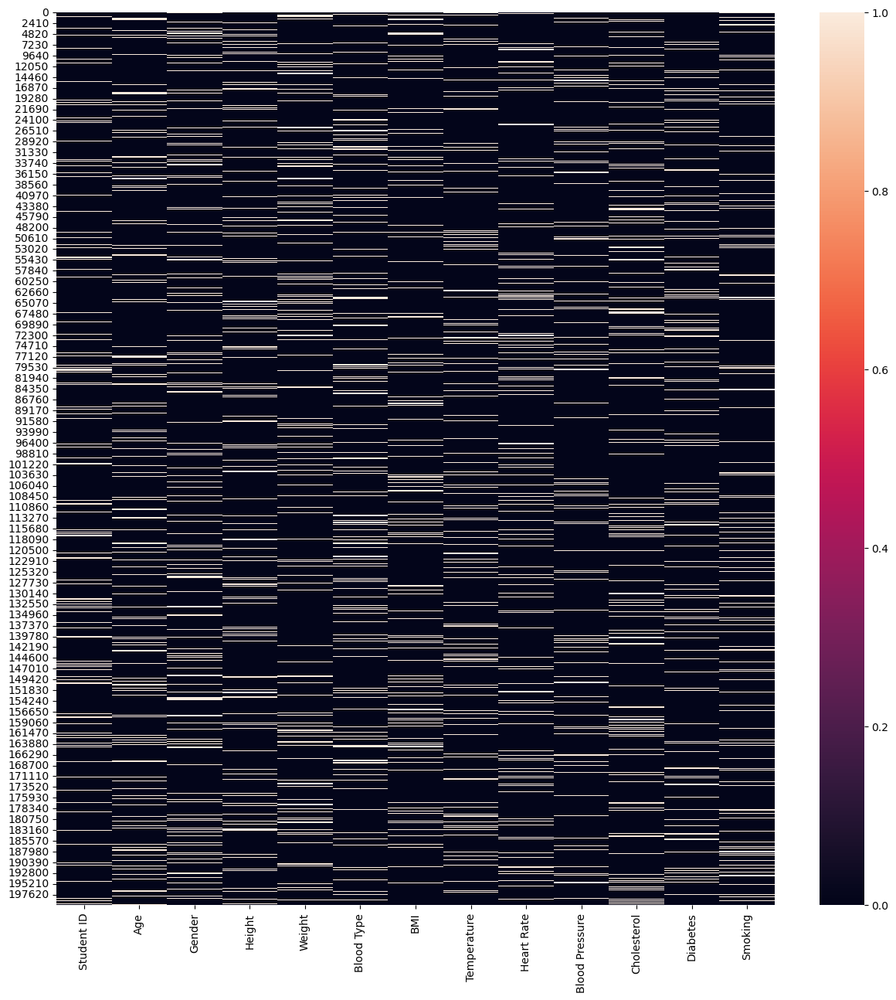

In [7]:
plt.figure(figsize=(15,15))
sns.heatmap(df.isnull())
plt.show()

# Completing the given data using MEAN, MEDIAN, MODE

In [8]:
df.isnull().sum()

Student ID        20000
Age               20000
Gender            20000
Height            20000
Weight            20000
Blood Type        20000
BMI               20000
Temperature       20000
Heart Rate        20000
Blood Pressure    20000
Cholesterol       20000
Diabetes          20000
Smoking           20000
dtype: int64

In [9]:
df_missing = df.isnull().sum()/df.shape[0] * 100
df_missing

Student ID        10.0
Age               10.0
Gender            10.0
Height            10.0
Weight            10.0
Blood Type        10.0
BMI               10.0
Temperature       10.0
Heart Rate        10.0
Blood Pressure    10.0
Cholesterol       10.0
Diabetes          10.0
Smoking           10.0
dtype: float64

In [10]:
df_num = df.select_dtypes(include = ['int64','float64'])
df_num
df_num_si = df_num.drop(['Student ID'],axis = 1)

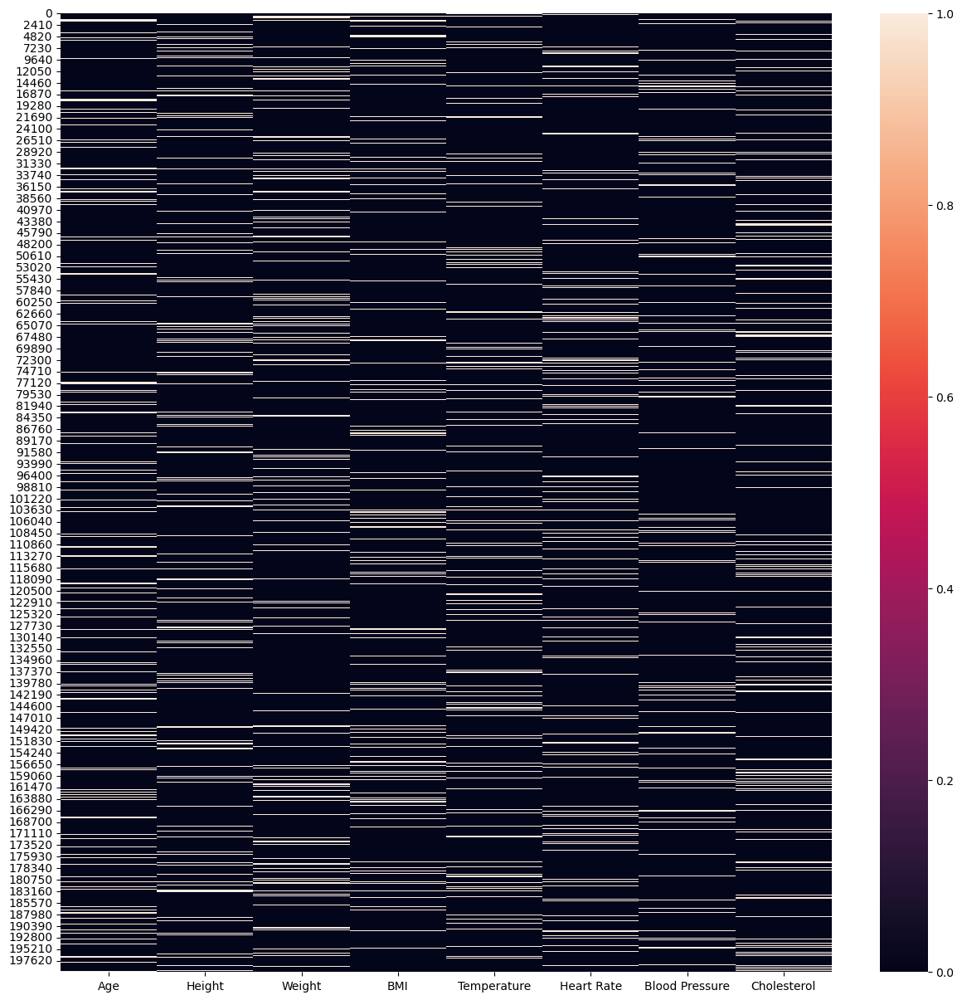

In [11]:
plt.figure(figsize = (15,15))
sns.heatmap(df_num_si.isnull())
plt.show()

In [12]:
missing_vals = [var for var in df_num_si.columns if df_num_si[var].isnull().sum()>0]
missing_vals

['Age',
 'Height',
 'Weight',
 'BMI',
 'Temperature',
 'Heart Rate',
 'Blood Pressure',
 'Cholesterol']

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

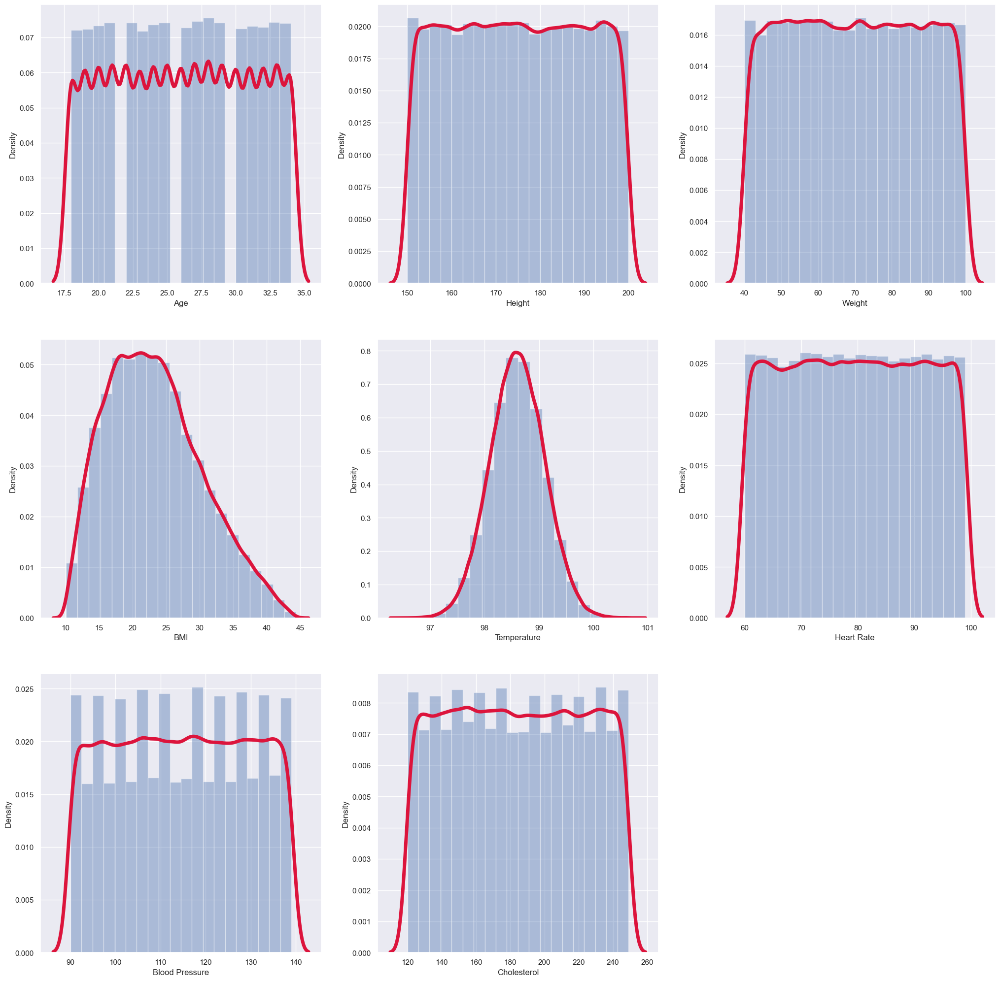

In [13]:
plt.figure(figsize = (25,25))
sns.set()
for i, var in enumerate(missing_vals):
    plt.subplot(3,3,i+1)
    sns.distplot(df_num_si[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'#DC143C'})

In [14]:
df_num_mean = df_num_si.fillna(df_num_si.mean())
df_num_mean.isnull().sum()

Age               0
Height            0
Weight            0
BMI               0
Temperature       0
Heart Rate        0
Blood Pressure    0
Cholesterol       0
dtype: int64

In [15]:
df_num_si.mean()

Age                26.021561
Height            174.947103
Weight             69.971585
BMI                23.338869
Temperature        98.600948
Heart Rate         79.503767
Blood Pressure    114.558033
Cholesterol       184.486361
dtype: float64

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

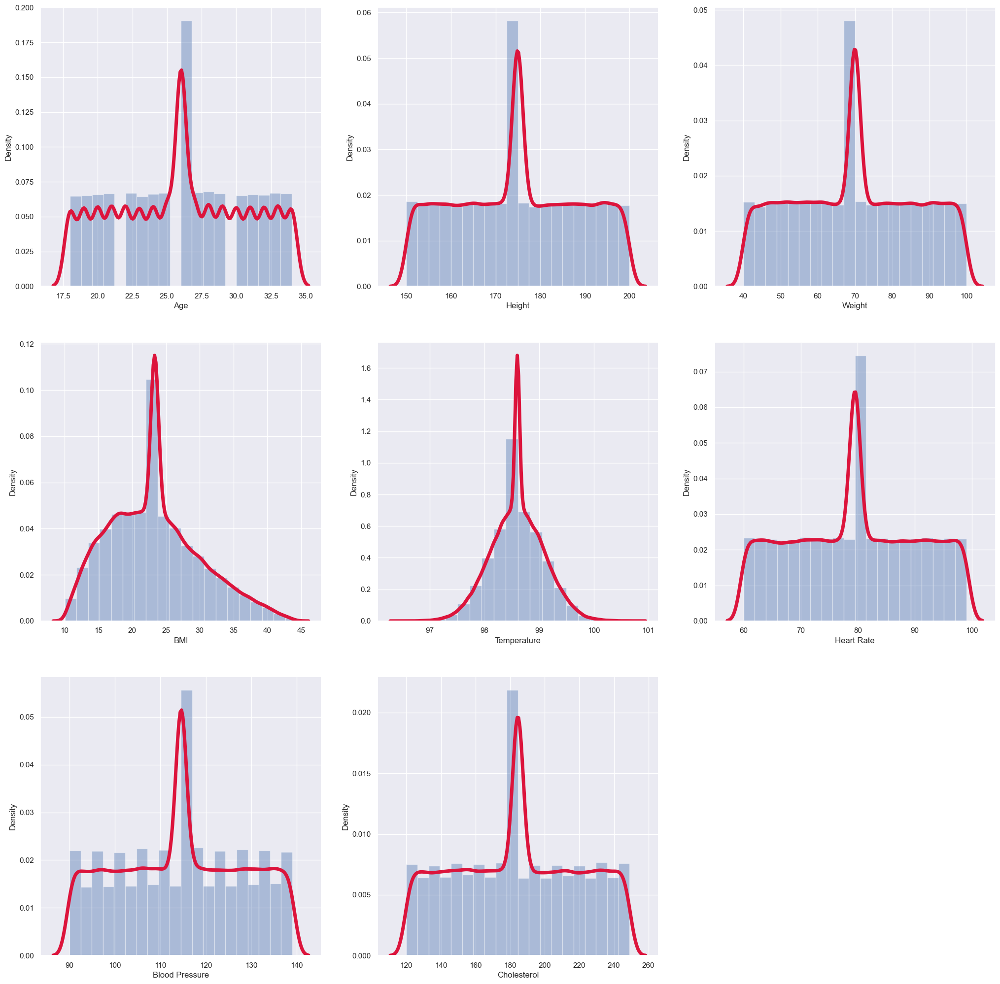

In [16]:
plt.figure(figsize = (25,25))
sns.set()
for i, var in enumerate(missing_vals):
    plt.subplot(3,3,i+1)
    sns.distplot(df_num_mean[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'#DC143C'})

In [17]:
df_num_si.median()

Age                26.000000
Height            174.899914
Weight             69.979384
BMI                22.671401
Temperature        98.599654
Heart Rate         80.000000
Blood Pressure    115.000000
Cholesterol       184.000000
dtype: float64

In [18]:
df_num_median = df_num_si.fillna(df_num_si.median())
df_num_median

,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol
0,18.0,161.777924,72.354947,27.645835,98.599654,95.0,109.0,203.0
1,26.0,152.069157,47.630941,22.671401,98.714977,93.0,104.0,163.0
2,32.0,182.537664,55.741083,16.729017,98.260293,76.0,130.0,216.0
3,30.0,182.112867,63.332207,19.096042,98.839605,99.0,112.0,141.0
4,23.0,174.899914,46.234173,22.671401,98.480008,95.0,115.0,231.0
...,...,...,...,...,...,...,...,...
199995,24.0,176.503260,95.756997,30.737254,99.170685,65.0,121.0,130.0
199996,29.0,163.917675,45.225194,16.831734,97.865785,62.0,125.0,198.0
199997,34.0,174.899914,99.648914,33.189303,98.768210,60.0,90.0,154.0
199998,30.0,156.446944,50.142824,20.486823,98.994212,61.0,106.0,225.0


D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

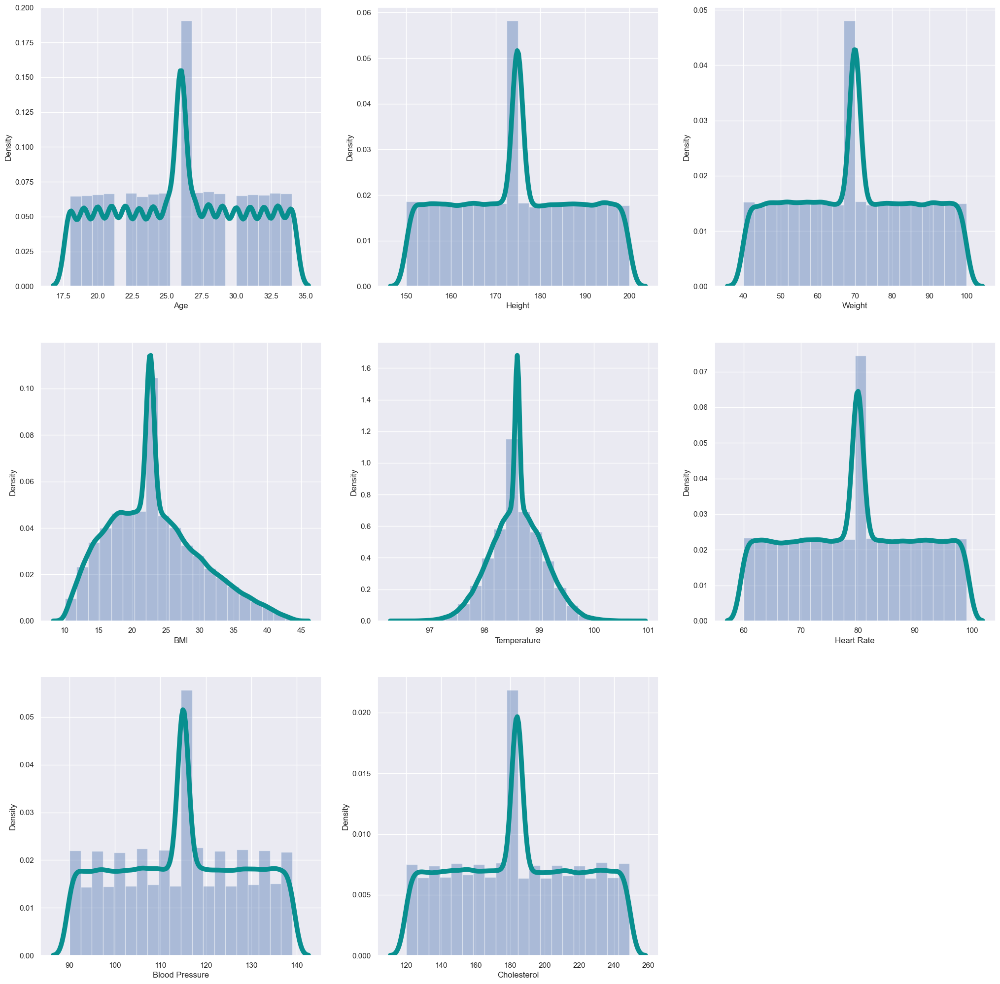

In [19]:
plt.figure(figsize = (25,25))
sns.set()
for i, var in enumerate(missing_vals):
    plt.subplot(3,3,i+1)
    sns.distplot(df_num_median[var], bins = 20, kde_kws = {"linewidth" : 7, 'color' : "#088F8F"})

<AxesSubplot:>

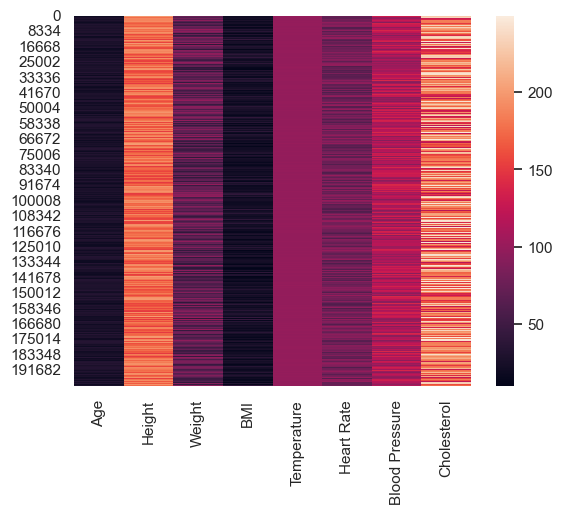

In [20]:
sns.heatmap(df_num_median)

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

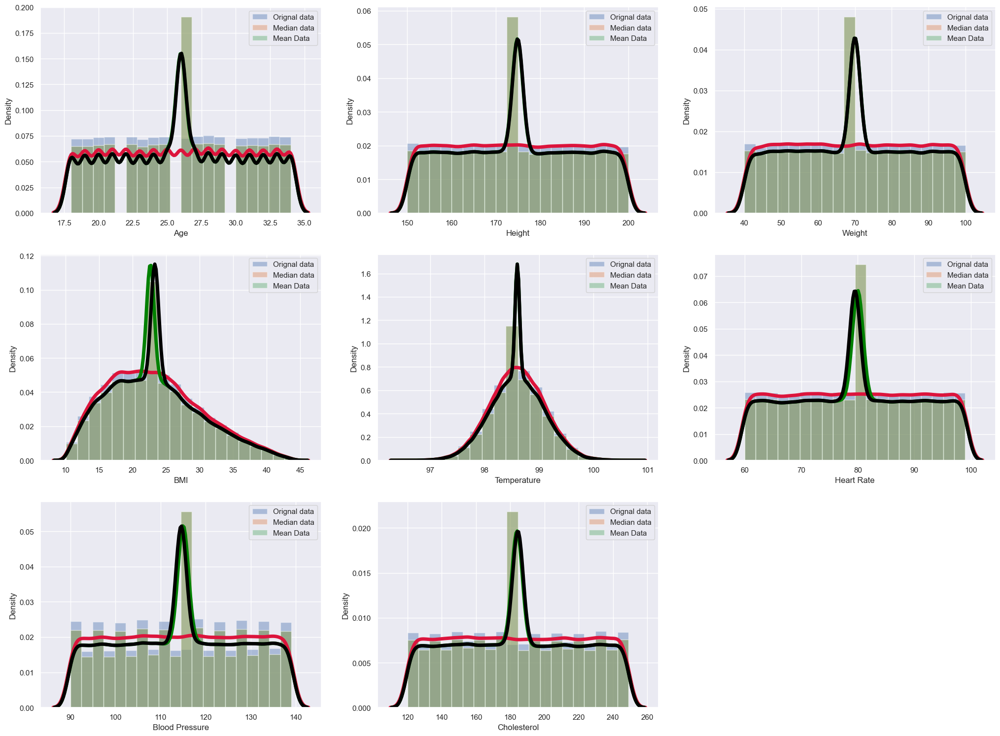

In [21]:
plt.figure(figsize = (25,25))
sns.set()
for i, var in enumerate(missing_vals):
    plt.subplot(4,3,i+1)
    sns.distplot(df_num_si[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'#DC143C'}, label = "Orignal data")
    sns.distplot(df_num_median[var], bins = 20, kde_kws =  {"linewidth" : 5, 'color':'green'}, label = "Median data")
    sns.distplot(df_num_mean[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'black'}, label = "Mean Data")
    plt.legend()

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

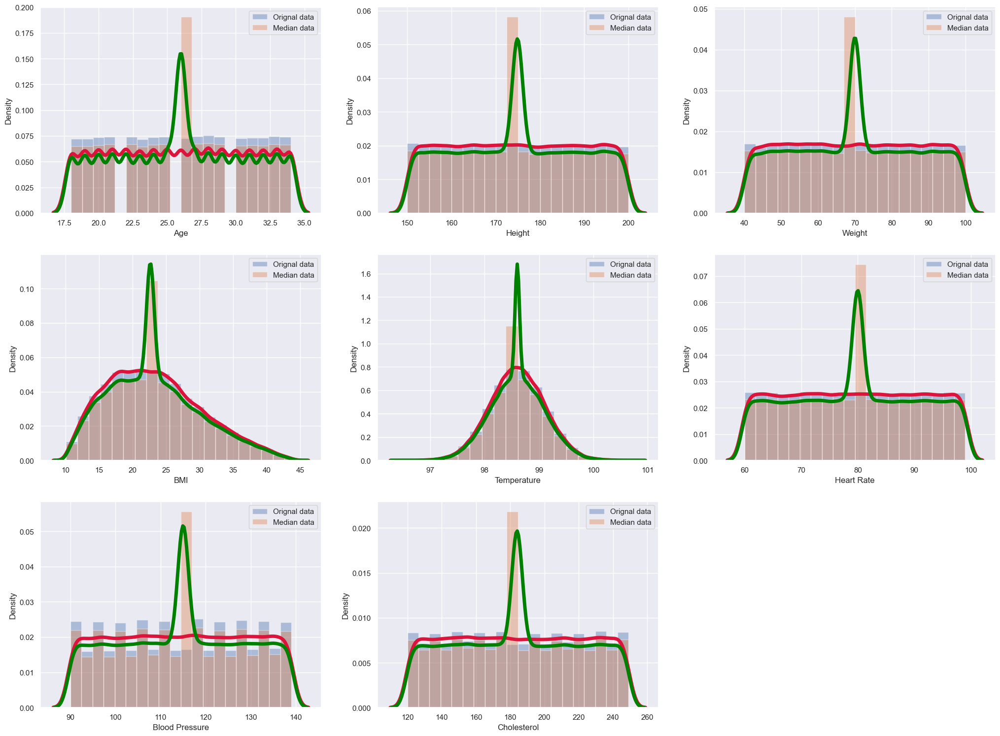

In [22]:
plt.figure(figsize = (25,25))

sns.set()
for i, var in enumerate(missing_vals):
    plt.subplot(4,3,i+1)
    sns.distplot(df_num_si[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'#DC143C'}, label = "Orignal data")
    sns.distplot(df_num_median[var], bins = 20, kde_kws =  {"linewidth" : 5, 'color':'green'}, label = "Median data")
    plt.legend()

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

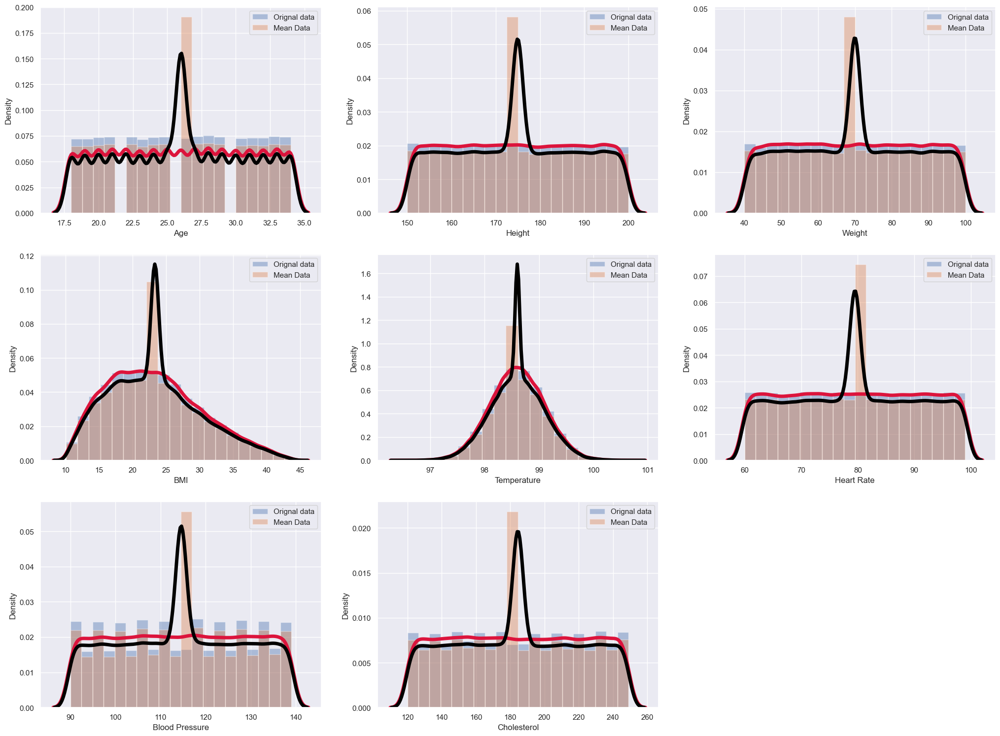

In [23]:
plt.figure(figsize = (25,25))

sns.set()
for i, var in enumerate(missing_vals):
    plt.subplot(4,3,i+1)
    sns.distplot(df_num_si[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'#DC143C'}, label = "Orignal data")
    sns.distplot(df_num_mean[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'black'}, label = "Mean Data")
    plt.legend()

D:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning

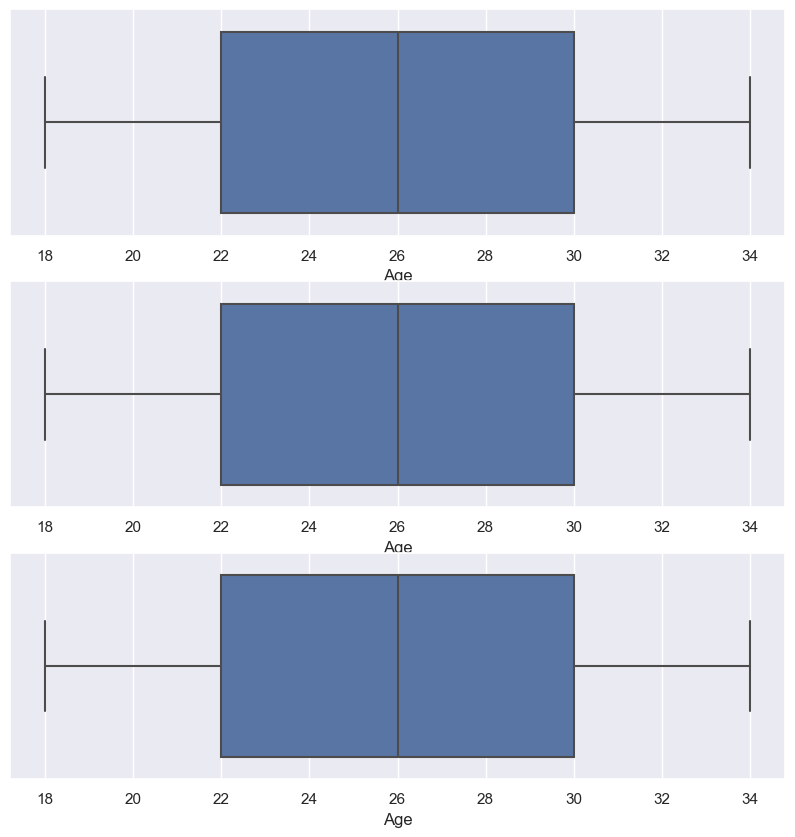

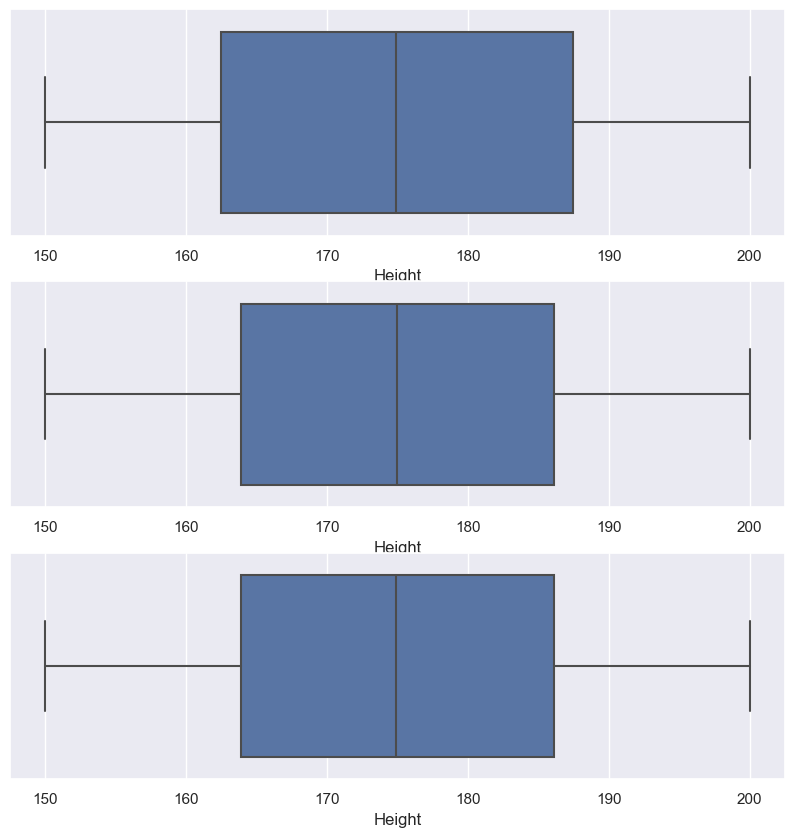

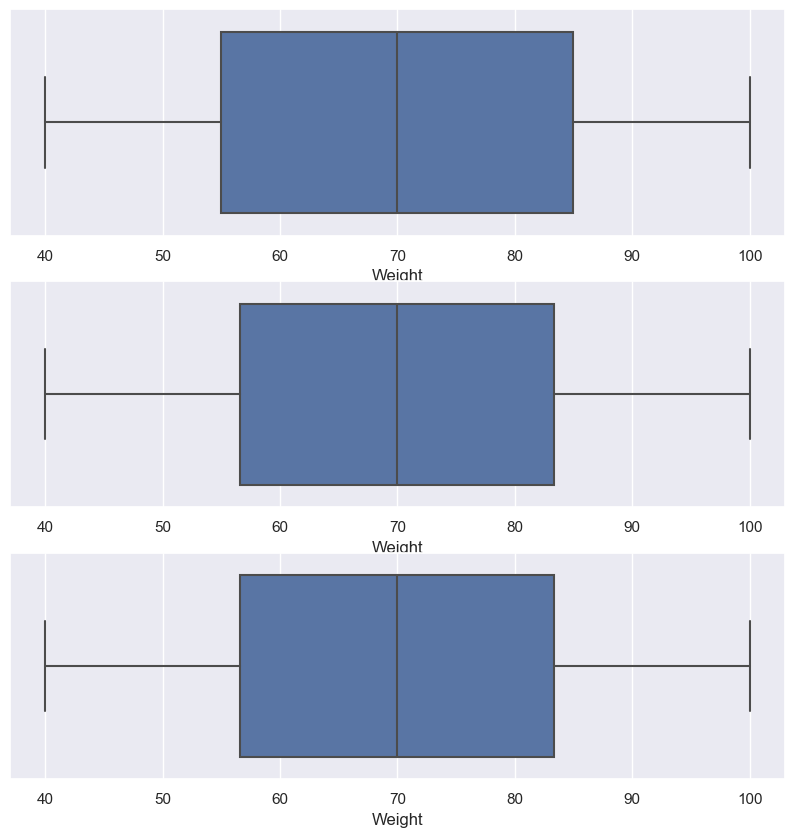

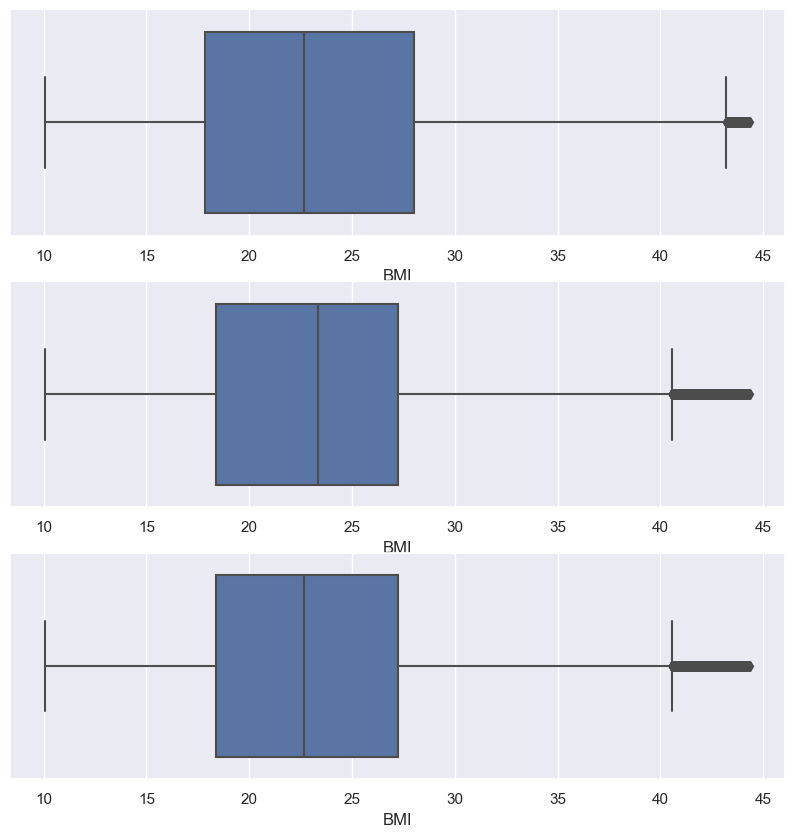

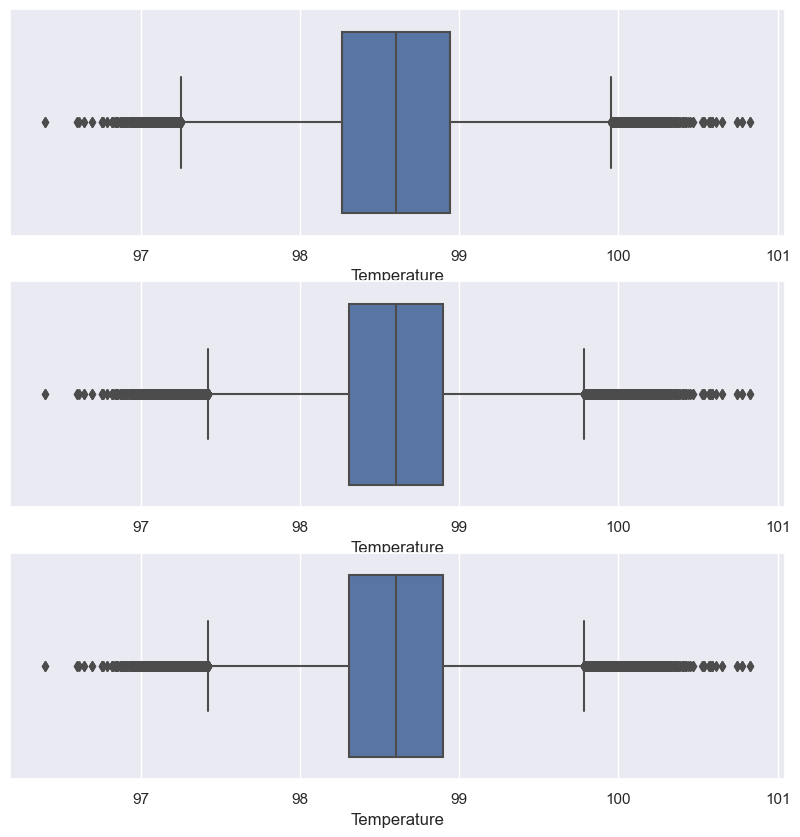

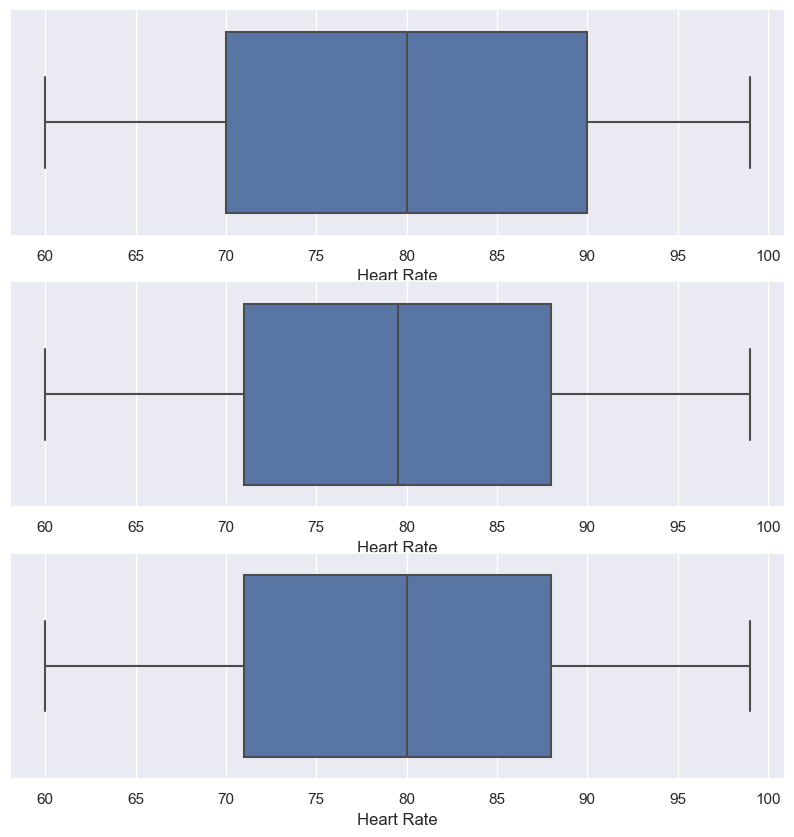

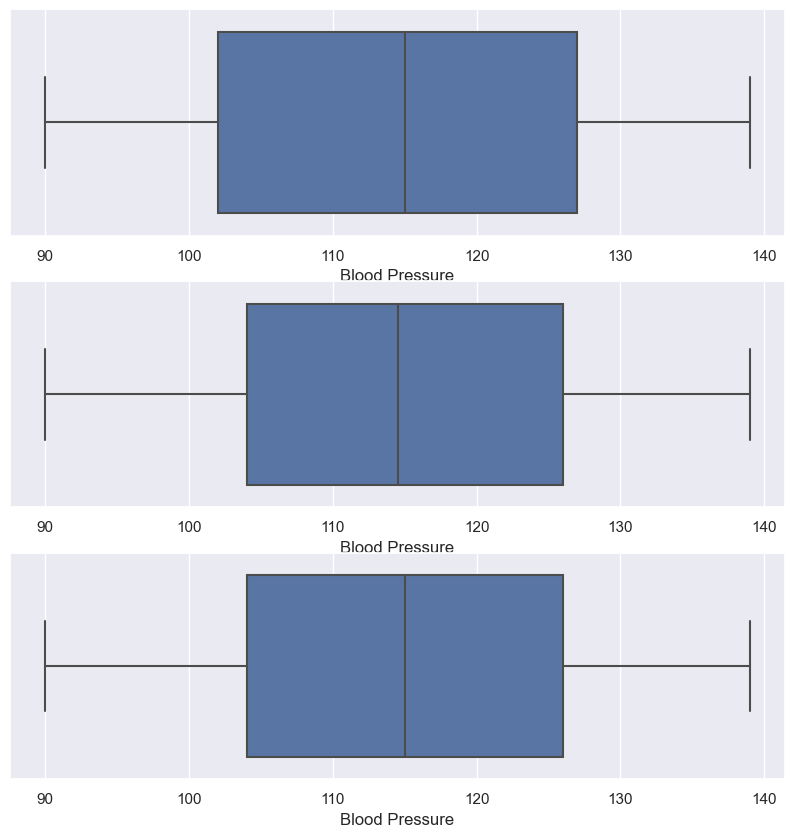

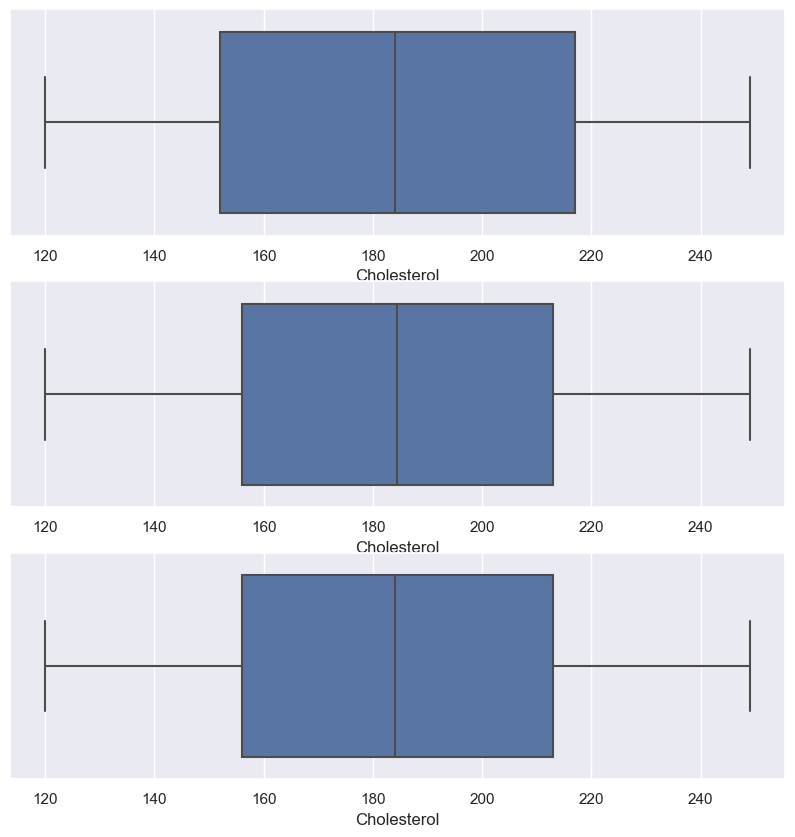

In [24]:
for i,var in enumerate(missing_vals):
    plt.figure(figsize = (10,10))
    plt.subplot(3,1,1)
    sns.boxplot(df_num_si[var])
    plt.subplot(3,1,2)
    sns.boxplot(df_num_mean[var])
    plt.subplot(3,1,3)
    sns.boxplot(df_num_median[var])

In [25]:
df_concat = pd.concat([df_num_si[missing_vals],df_num_mean[missing_vals],df_num_median[missing_vals]],axis = 1)
df_concat.head()

,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol
0,18.0,161.777924,72.354947,27.645835,NaN,95.0,109.0,203.0,18.000000,161.777924,72.354947,27.645835,98.600948,95.0,109.000000,203.0,18.0,161.777924,72.354947,27.645835,98.599654,95.0,109.0,203.0
1,NaN,152.069157,47.630941,NaN,98.714977,93.0,104.0,163.0,26.021561,152.069157,47.630941,23.338869,98.714977,93.0,104.000000,163.0,26.0,152.069157,47.630941,22.671401,98.714977,93.0,104.0,163.0
2,32.0,182.537664,55.741083,16.729017,98.260293,76.0,130.0,216.0,32.000000,182.537664,55.741083,16.729017,98.260293,76.0,130.000000,216.0,32.0,182.537664,55.741083,16.729017,98.260293,76.0,130.0,216.0
3,30.0,182.112867,63.332207,19.096042,98.839605,99.0,112.0,141.0,30.000000,182.112867,63.332207,19.096042,98.839605,99.0,112.000000,141.0,30.0,182.112867,63.332207,19.096042,98.839605,99.0,112.0,141.0
4,23.0,NaN,46.234173,NaN,98.480008,95.0,NaN,231.0,23.000000,174.947103,46.234173,23.338869,98.480008,95.0,114.558033,231.0,23.0,174.899914,46.234173,22.671401,98.480008,95.0,115.0,231.0


In [26]:
df_concat[df_concat.isnull().any(axis = 1)]

,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol
0,18.0,161.777924,72.354947,27.645835,NaN,95.0,109.0,203.0,18.000000,161.777924,72.354947,27.645835,98.600948,95.000000,109.000000,203.000000,18.0,161.777924,72.354947,27.645835,98.599654,95.0,109.0,203.0
1,NaN,152.069157,47.630941,NaN,98.714977,93.0,104.0,163.0,26.021561,152.069157,47.630941,23.338869,98.714977,93.000000,104.000000,163.000000,26.0,152.069157,47.630941,22.671401,98.714977,93.0,104.0,163.0
4,23.0,NaN,46.234173,NaN,98.480008,95.0,NaN,231.0,23.000000,174.947103,46.234173,23.338869,98.480008,95.000000,114.558033,231.000000,23.0,174.899914,46.234173,22.671401,98.480008,95.0,115.0,231.0
8,21.0,155.039678,42.958703,NaN,98.808053,NaN,111.0,243.0,21.000000,155.039678,42.958703,23.338869,98.808053,79.503767,111.000000,243.000000,21.0,155.039678,42.958703,22.671401,98.808053,80.0,111.0,243.0
10,28.0,152.973928,73.572814,31.440000,98.371843,60.0,NaN,241.0,28.000000,152.973928,73.572814,31.440000,98.371843,60.000000,114.558033,241.000000,28.0,152.973928,73.572814,31.440000,98.371843,60.0,115.0,241.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199987,33.0,169.061017,56.401454,19.733465,98.969486,81.0,118.0,NaN,33.000000,169.061017,56.401454,19.733465,98.969486,81.000000,118.000000,184.486361,33.0,169.061017,56.401454,19.733465,98.969486,81.0,118.0,184.0
199991,28.0,183.499177,NaN,26.527962,97.321680,70.0,113.0,140.0,28.000000,183.499177,69.971585,26.527962,97.321680,70.000000,113.000000,140.000000,28.0,183.499177,69.979384,26.527962,97.321680,70.0,113.0,140.0
199993,22.0,NaN,46.155224,NaN,98.331019,93.0,100.0,NaN,22.000000,174.947103,46.155224,23.338869,98.331019,93.000000,100.000000,184.486361,22.0,174.899914,46.155224,22.671401,98.331019,93.0,100.0,184.0
199994,22.0,159.486907,NaN,27.631082,98.971976,86.0,134.0,208.0,22.000000,159.486907,69.971585,27.631082,98.971976,86.000000,134.000000,208.000000,22.0,159.486907,69.979384,27.631082,98.971976,86.0,134.0,208.0


# Missing value interperation using Mode

In [27]:
cat_vars = df.select_dtypes(include = 'O')
cat_vars.head()

,Gender,Blood Type,Diabetes,Smoking
0,Female,O,No,NaN
1,Male,B,No,No
2,Female,A,Yes,No
3,Male,B,No,Yes
4,Female,O,No,No


In [28]:
cat_vars.isnull().sum()

Gender        20000
Blood Type    20000
Diabetes      20000
Smoking       20000
dtype: int64

In [29]:
missing_val_perc = cat_vars.isnull().mean()*100
missing_val_perc

Gender        10.0
Blood Type    10.0
Diabetes      10.0
Smoking       10.0
dtype: float64

In [30]:
isnull_perc = cat_vars.isnull().mean()*100
miss_vals_cat = isnull_perc[isnull_perc>0].keys()
miss_vals_cat

Index(['Gender', 'Blood Type', 'Diabetes', 'Smoking'], dtype='object')

In [31]:
df[miss_vals_cat]

,Gender,Blood Type,Diabetes,Smoking
0,Female,O,No,NaN
1,Male,B,No,No
2,Female,A,Yes,No
3,Male,B,No,Yes
4,Female,O,No,No
...,...,...,...,...
199995,Male,B,No,No
199996,Female,NaN,No,Yes
199997,Female,NaN,NaN,No
199998,Female,A,No,No


In [32]:
for var in miss_vals_cat:
    cat_vars[var].fillna(cat_vars[var].mode()[0], inplace = True)
    print(var, "  ", cat_vars[var].mode()[0])

Gender    Male
Blood Type    B
Diabetes    No
Smoking    No


In [33]:
cat_vars.isnull().sum()

Gender        0
Blood Type    0
Diabetes      0
Smoking       0
dtype: int64

In [34]:
miss_vals_cat

Index(['Gender', 'Blood Type', 'Diabetes', 'Smoking'], dtype='object')

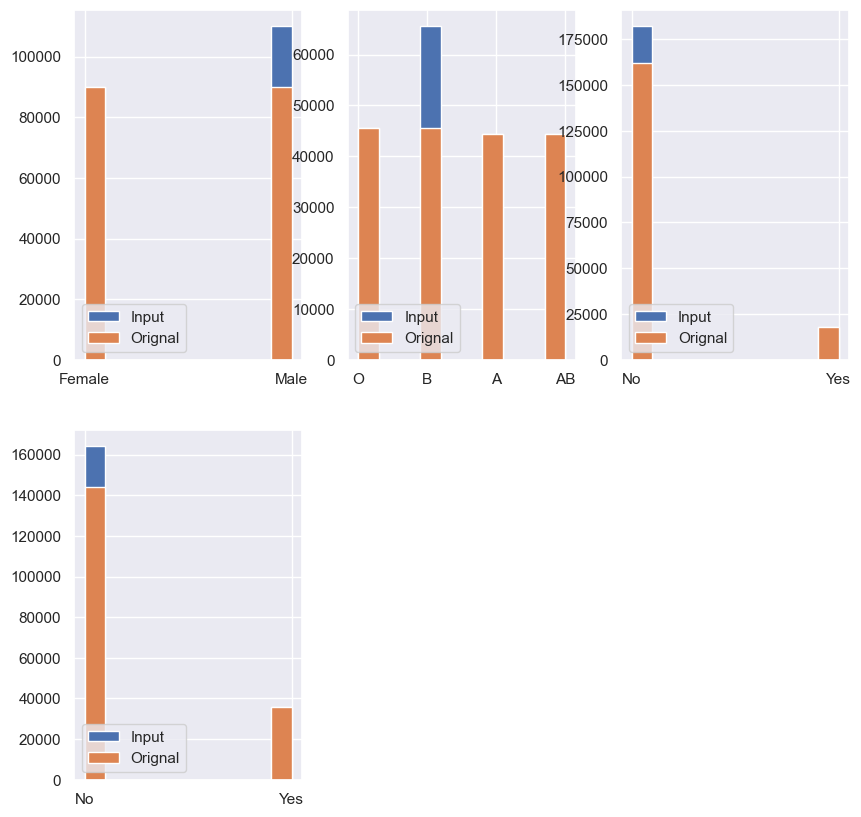

In [35]:
plt.figure(figsize = (10,10))
for i,var in enumerate(miss_vals_cat):
    plt.subplot(2,3,i+1)
    plt.hist(cat_vars[var],label = "Input")
    plt.hist(df[var].dropna(),label = "Orignal")
    plt.legend(loc = "lower left")

# using SCIKIT Learn for fil in missing values

In [36]:
train_df = pd.read_csv("medical_students_dataset.csv")
pd.set_option("display.max_columns",None)

In [37]:
train_df

,Student ID,Age,Gender,Height,Weight,Blood Type,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Diabetes,Smoking
0,1.0,18.0,Female,161.777924,72.354947,O,27.645835,NaN,95.0,109.0,203.0,No,NaN
1,2.0,NaN,Male,152.069157,47.630941,B,NaN,98.714977,93.0,104.0,163.0,No,No
2,3.0,32.0,Female,182.537664,55.741083,A,16.729017,98.260293,76.0,130.0,216.0,Yes,No
3,NaN,30.0,Male,182.112867,63.332207,B,19.096042,98.839605,99.0,112.0,141.0,No,Yes
4,5.0,23.0,Female,NaN,46.234173,O,NaN,98.480008,95.0,NaN,231.0,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,NaN,24.0,Male,176.503260,95.756997,B,30.737254,99.170685,65.0,121.0,130.0,No,No
199996,99997.0,29.0,Female,163.917675,45.225194,NaN,16.831734,97.865785,62.0,125.0,198.0,No,Yes
199997,99998.0,34.0,Female,NaN,99.648914,NaN,33.189303,98.768210,60.0,90.0,154.0,NaN,No
199998,99999.0,30.0,Female,156.446944,50.142824,A,20.486823,98.994212,61.0,106.0,225.0,No,No


In [38]:
train_df.shape

(200000, 13)

In [39]:
train_df.head()

,Student ID,Age,Gender,Height,Weight,Blood Type,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Diabetes,Smoking
0,1.0,18.0,Female,161.777924,72.354947,O,27.645835,NaN,95.0,109.0,203.0,No,NaN
1,2.0,NaN,Male,152.069157,47.630941,B,NaN,98.714977,93.0,104.0,163.0,No,No
2,3.0,32.0,Female,182.537664,55.741083,A,16.729017,98.260293,76.0,130.0,216.0,Yes,No
3,NaN,30.0,Male,182.112867,63.332207,B,19.096042,98.839605,99.0,112.0,141.0,No,Yes
4,5.0,23.0,Female,NaN,46.234173,O,NaN,98.480008,95.0,NaN,231.0,No,No


In [40]:
X_train = train_df.drop(columns = "Heart Rate")
y_train = train_df["Heart Rate"]

In [41]:
print(X_train.shape)
y_train.shape

(200000, 12)


(200000,)

# Numerical missing value Imputation

In [42]:
num_vars = X_train.select_dtypes(include = ["int64","float"]).columns

In [43]:
X_train[num_vars].isnull().sum()

Student ID        20000
Age               20000
Height            20000
Weight            20000
BMI               20000
Temperature       20000
Blood Pressure    20000
Cholesterol       20000
dtype: int64

In [44]:
adding_mean = SimpleImputer(strategy = "mean")

In [45]:
adding_mean.fit(X_train[num_vars])

SimpleImputer()

In [46]:
adding_mean.statistics_

array([4.99740421e+04, 2.60215611e+01, 1.74947103e+02, 6.99715851e+01,
       2.33388694e+01, 9.86009479e+01, 1.14558033e+02, 1.84486361e+02])

In [47]:
adding_mean.transform(X_train[num_vars])

array([[1.00000000e+00, 1.80000000e+01, 1.61777924e+02, ...,
        9.86009479e+01, 1.09000000e+02, 2.03000000e+02],
       [2.00000000e+00, 2.60215611e+01, 1.52069157e+02, ...,
        9.87149768e+01, 1.04000000e+02, 1.63000000e+02],
       [3.00000000e+00, 3.20000000e+01, 1.82537664e+02, ...,
        9.82602930e+01, 1.30000000e+02, 2.16000000e+02],
       ...,
       [9.99980000e+04, 3.40000000e+01, 1.74947103e+02, ...,
        9.87682100e+01, 9.00000000e+01, 1.54000000e+02],
       [9.99990000e+04, 3.00000000e+01, 1.56446944e+02, ...,
        9.89942120e+01, 1.06000000e+02, 2.25000000e+02],
       [1.00000000e+05, 2.00000000e+01, 1.53927409e+02, ...,
        9.85958169e+01, 1.33000000e+02, 1.32000000e+02]])

In [48]:
X_train[num_vars] = adding_mean.transform(X_train[num_vars])

In [49]:
X_train[num_vars].isnull().sum().sum()

0

# USING CATEGORICAL VARIABLES

In [50]:
cat_vars = X_train.select_dtypes(include = 'O').columns
cat_vars

Index(['Gender', 'Blood Type', 'Diabetes', 'Smoking'], dtype='object')

In [51]:
X_train[cat_vars].isnull().sum()

Gender        20000
Blood Type    20000
Diabetes      20000
Smoking       20000
dtype: int64

In [52]:
adding_mode = SimpleImputer(strategy = "most_frequent")

In [53]:
adding_mode.fit(X_train[cat_vars])

SimpleImputer(strategy='most_frequent')

In [54]:
adding_mode.fit_transform(X_train[cat_vars])

array([['Female', 'O', 'No', 'No'],
       ['Male', 'B', 'No', 'No'],
       ['Female', 'A', 'Yes', 'No'],
       ...,
       ['Female', 'B', 'No', 'No'],
       ['Female', 'A', 'No', 'No'],
       ['Female', 'O', 'No', 'No']], dtype=object)

In [55]:
adding_mode.statistics_

array(['Male', 'B', 'No', 'No'], dtype=object)

In [56]:
adding_mode.transform(X_train[cat_vars])

array([['Female', 'O', 'No', 'No'],
       ['Male', 'B', 'No', 'No'],
       ['Female', 'A', 'Yes', 'No'],
       ...,
       ['Female', 'B', 'No', 'No'],
       ['Female', 'A', 'No', 'No'],
       ['Female', 'O', 'No', 'No']], dtype=object)

In [57]:
X_train[cat_vars] = adding_mode.fit_transform(X_train[cat_vars])

In [58]:
X_train[cat_vars].isnull().sum()

Gender        0
Blood Type    0
Diabetes      0
Smoking       0
dtype: int64

# USING PIPELINE

In [59]:
train_df = pd.read_csv("medical_students_dataset.csv")
pd.set_option("display.max_columns",None)
train_df.shape

(200000, 13)

In [60]:
X_train = train_df.drop(columns = "Heart Rate")
y_train = train_df["Heart Rate"]

In [61]:
print(X_train.shape)
print(y_train.shape)

(200000, 12)
(200000,)


In [62]:
isnull_sum = X_train.isnull().sum()
isnull_sum

Student ID        20000
Age               20000
Gender            20000
Height            20000
Weight            20000
Blood Type        20000
BMI               20000
Temperature       20000
Blood Pressure    20000
Cholesterol       20000
Diabetes          20000
Smoking           20000
dtype: int64

D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\Anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

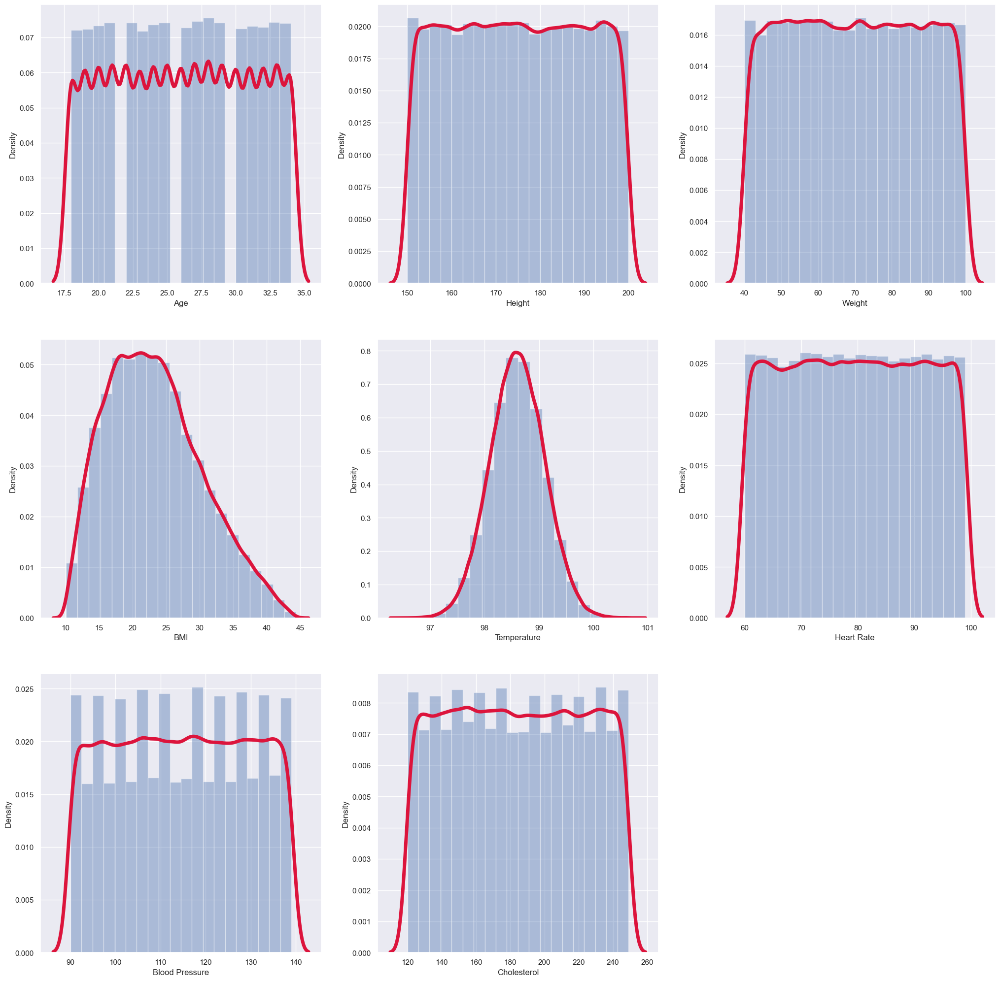

In [63]:
plt.figure(figsize = (25,25))
sns.set()
for i, var in enumerate(missing_vals):
    plt.subplot(3,3,i+1)
    sns.distplot(df_num_si[var], bins = 20, kde_kws = {"linewidth" : 5, 'color':'#DC143C'})

In [64]:
num_var = X_train.select_dtypes(include = ["int64","float64"]).columns
num_var_miss = [var for var in num_var if isnull_sum[var]>0]
num_var_miss

['Student ID',
 'Age',
 'Height',
 'Weight',
 'BMI',
 'Temperature',
 'Blood Pressure',
 'Cholesterol']

In [65]:
cat_var = X_train.select_dtypes(include = ["O"]).columns
cat_var_miss = [var for var in cat_var if isnull_sum[var]>0]
cat_var_miss

['Gender', 'Blood Type', 'Diabetes', 'Smoking']

In [66]:
num_var_mean = ['Age','BMI','Temperature']
num_var_median = ['Height','Weight','Blood Pressure','Cholesterol']
cat_var_mode = ['Diabetes','Smoking']
cat_var_const = ['Gender','Blood Type']

In [67]:
num_var_mean_imputer = Pipeline(steps=[("imputer",SimpleImputer(strategy = "mean"))])
num_var_median_imputer = Pipeline(steps=[("imputer",SimpleImputer(strategy = "median"))])
cat_var_mode_imputer = Pipeline(steps=[("imputer",SimpleImputer(strategy = "most_frequent"))])
cat_var_missing_imputer = Pipeline(steps=[("imputer",SimpleImputer(strategy = "constant",fill_value = "missing"))])

In [68]:
preprocessor = ColumnTransformer(transformers = [("mean_imputer", num_var_mean_imputer,num_var_mean),
                                ("median_imputer", num_var_median_imputer, num_var_median),
                                ("mode_imputer",cat_var_mode_imputer,cat_var_mode),
                                ("missing_imputer",cat_var_missing_imputer,cat_var_const)])


In [69]:
preprocessor.fit(X_train)

ColumnTransformer(transformers=[('mean_imputer',
                                 Pipeline(steps=[('imputer', SimpleImputer())]),
                                 ['Age', 'BMI', 'Temperature']),
                                ('median_imputer',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median'))]),
                                 ['Height', 'Weight', 'Blood Pressure',
                                  'Cholesterol']),
                                ('mode_imputer',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent'))]),
                                 ['Diabetes', 'Smoking']),
                                ('missing_imputer',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(fill_value='missing',
                     

In [70]:
preprocessor.transform

<bound method ColumnTransformer.transform of ColumnTransformer(transformers=[('mean_imputer',
                                 Pipeline(steps=[('imputer', SimpleImputer())]),
                                 ['Age', 'BMI', 'Temperature']),
                                ('median_imputer',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='median'))]),
                                 ['Height', 'Weight', 'Blood Pressure',
                                  'Cholesterol']),
                                ('mode_imputer',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent'))]),
                                 ['Diabetes', 'Smoking']),
                                ('missing_imputer',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImpute

In [71]:
preprocessor.named_transformers_["mean_imputer"].named_steps["imputer"].statistics_

array([26.02156111, 23.33886936, 98.60094788])

In [72]:
x_train_clean = preprocessor.transform(X_train)

In [73]:
x_train_clean

array([[18.0, 27.64583507227044, 98.60094787707668, ..., 'No', 'Female',
        'O'],
       [26.02156111111111, 23.338869359639226, 98.71497675065052, ...,
        'No', 'Male', 'B'],
       [32.0, 16.729017143841244, 98.26029301637767, ..., 'No', 'Female',
        'A'],
       ...,
       [34.0, 33.189303167608315, 98.7682099908951, ..., 'No', 'Female',
        'missing'],
       [30.0, 20.4868231624552, 98.99421197262517, ..., 'No', 'Female',
        'A'],
       [20.0, 42.175188518828016, 98.59581694703684, ..., 'No', 'Female',
        'O']], dtype=object)

In [74]:
preprocessor.transformers_


[('mean_imputer',
  Pipeline(steps=[('imputer', SimpleImputer())]),
  ['Age', 'BMI', 'Temperature']),
 ('median_imputer',
  Pipeline(steps=[('imputer', SimpleImputer(strategy='median'))]),
  ['Height', 'Weight', 'Blood Pressure', 'Cholesterol']),
 ('mode_imputer',
  Pipeline(steps=[('imputer', SimpleImputer(strategy='most_frequent'))]),
  ['Diabetes', 'Smoking']),
 ('missing_imputer',
  Pipeline(steps=[('imputer',
                   SimpleImputer(fill_value='missing', strategy='constant'))]),
  ['Gender', 'Blood Type']),
 ('remainder', 'drop', [0])]

In [75]:
x_train_clean

array([[18.0, 27.64583507227044, 98.60094787707668, ..., 'No', 'Female',
        'O'],
       [26.02156111111111, 23.338869359639226, 98.71497675065052, ...,
        'No', 'Male', 'B'],
       [32.0, 16.729017143841244, 98.26029301637767, ..., 'No', 'Female',
        'A'],
       ...,
       [34.0, 33.189303167608315, 98.7682099908951, ..., 'No', 'Female',
        'missing'],
       [30.0, 20.4868231624552, 98.99421197262517, ..., 'No', 'Female',
        'A'],
       [20.0, 42.175188518828016, 98.59581694703684, ..., 'No', 'Female',
        'O']], dtype=object)

In [76]:
X_train_new = pd.DataFrame(x_train_clean, columns = num_var_mean+num_var_median+cat_var_mode+cat_var_const)

In [77]:
X_train_new.shape

(200000, 11)

In [78]:
X_train_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Age             200000 non-null  object
 1   BMI             200000 non-null  object
 2   Temperature     200000 non-null  object
 3   Height          200000 non-null  object
 4   Weight          200000 non-null  object
 5   Blood Pressure  200000 non-null  object
 6   Cholesterol     200000 non-null  object
 7   Diabetes        200000 non-null  object
 8   Smoking         200000 non-null  object
 9   Gender          200000 non-null  object
 10  Blood Type      200000 non-null  object
dtypes: object(11)
memory usage: 16.8+ MB


In [79]:
df.shape

(200000, 13)

In [80]:
train_df["Smoking"].value_counts()

No     143971
Yes     36029
Name: Smoking, dtype: int64

In [81]:
X_train_new["Smoking"].value_counts()

No     163971
Yes     36029
Name: Smoking, dtype: int64

In [82]:
X_train_new

,Age,BMI,Temperature,Height,Weight,Blood Pressure,Cholesterol,Diabetes,Smoking,Gender,Blood Type
0,18.0,27.645835,98.600948,161.777924,72.354947,109.0,203.0,No,No,Female,O
1,26.021561,23.338869,98.714977,152.069157,47.630941,104.0,163.0,No,No,Male,B
2,32.0,16.729017,98.260293,182.537664,55.741083,130.0,216.0,Yes,No,Female,A
3,30.0,19.096042,98.839605,182.112867,63.332207,112.0,141.0,No,Yes,Male,B
4,23.0,23.338869,98.480008,174.899914,46.234173,115.0,231.0,No,No,Female,O
...,...,...,...,...,...,...,...,...,...,...,...
199995,24.0,30.737254,99.170685,176.50326,95.756997,121.0,130.0,No,No,Male,B
199996,29.0,16.831734,97.865785,163.917675,45.225194,125.0,198.0,No,Yes,Female,missing
199997,34.0,33.189303,98.76821,174.899914,99.648914,90.0,154.0,No,No,Female,missing
199998,30.0,20.486823,98.994212,156.446944,50.142824,106.0,225.0,No,No,Female,A


In [83]:
X_train_new["Student ID"] = X_train["Student ID"]

In [84]:
X_train_new.head()

,Age,BMI,Temperature,Height,Weight,Blood Pressure,Cholesterol,Diabetes,Smoking,Gender,Blood Type,Student ID
0,18.0,27.645835,98.600948,161.777924,72.354947,109.0,203.0,No,No,Female,O,1.0
1,26.021561,23.338869,98.714977,152.069157,47.630941,104.0,163.0,No,No,Male,B,2.0
2,32.0,16.729017,98.260293,182.537664,55.741083,130.0,216.0,Yes,No,Female,A,3.0
3,30.0,19.096042,98.839605,182.112867,63.332207,112.0,141.0,No,Yes,Male,B,NaN
4,23.0,23.338869,98.480008,174.899914,46.234173,115.0,231.0,No,No,Female,O,5.0


In [85]:
X_train_new.round(1)

,Age,BMI,Temperature,Height,Weight,Blood Pressure,Cholesterol,Diabetes,Smoking,Gender,Blood Type,Student ID
0,18.0,27.645835,98.600948,161.777924,72.354947,109.0,203.0,No,No,Female,O,1.0
1,26.021561,23.338869,98.714977,152.069157,47.630941,104.0,163.0,No,No,Male,B,2.0
2,32.0,16.729017,98.260293,182.537664,55.741083,130.0,216.0,Yes,No,Female,A,3.0
3,30.0,19.096042,98.839605,182.112867,63.332207,112.0,141.0,No,Yes,Male,B,NaN
4,23.0,23.338869,98.480008,174.899914,46.234173,115.0,231.0,No,No,Female,O,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
199995,24.0,30.737254,99.170685,176.50326,95.756997,121.0,130.0,No,No,Male,B,NaN
199996,29.0,16.831734,97.865785,163.917675,45.225194,125.0,198.0,No,Yes,Female,missing,99997.0
199997,34.0,33.189303,98.76821,174.899914,99.648914,90.0,154.0,No,No,Female,missing,99998.0
199998,30.0,20.486823,98.994212,156.446944,50.142824,106.0,225.0,No,No,Female,A,99999.0


In [86]:
X_train_new['Age'] = X_train_new['Age'].apply(np.floor)

In [98]:
X_train_new.isnull().sum()

Age                   0
BMI                   0
Temperature           0
Height                0
Weight                0
Blood Pressure        0
Cholesterol           0
Diabetes              0
Smoking               0
Gender                0
Blood Type            0
Student ID        20000
dtype: int64

In [88]:
X_train_new.isnull().sum()

Age                   0
BMI                   0
Temperature           0
Height                0
Weight                0
Blood Pressure        0
Cholesterol           0
Diabetes              0
Smoking               0
Gender                0
Blood Type            0
Student ID        20000
dtype: int64

# DUMMY VARABLES AND ONE HOT ENCODING

In [233]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [234]:
medical_students = pd.read_csv('medical_students_dataset.csv')

In [235]:
medical_dummies = pd.get_dummies(medical_students,drop_first = False)
medical_dummies

,Student ID,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Gender_Female,Gender_Male,Blood Type_A,Blood Type_AB,Blood Type_B,Blood Type_O,Diabetes_No,Diabetes_Yes,Smoking_No,Smoking_Yes
0,1.0,18.0,161.777924,72.354947,27.645835,NaN,95.0,109.0,203.0,1,0,0,0,0,1,1,0,0,0
1,2.0,NaN,152.069157,47.630941,NaN,98.714977,93.0,104.0,163.0,0,1,0,0,1,0,1,0,1,0
2,3.0,32.0,182.537664,55.741083,16.729017,98.260293,76.0,130.0,216.0,1,0,1,0,0,0,0,1,1,0
3,NaN,30.0,182.112867,63.332207,19.096042,98.839605,99.0,112.0,141.0,0,1,0,0,1,0,1,0,0,1
4,5.0,23.0,NaN,46.234173,NaN,98.480008,95.0,NaN,231.0,1,0,0,0,0,1,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,NaN,24.0,176.503260,95.756997,30.737254,99.170685,65.0,121.0,130.0,0,1,0,0,1,0,1,0,1,0
199996,99997.0,29.0,163.917675,45.225194,16.831734,97.865785,62.0,125.0,198.0,1,0,0,0,0,0,1,0,0,1
199997,99998.0,34.0,NaN,99.648914,33.189303,98.768210,60.0,90.0,154.0,1,0,0,0,0,0,0,0,1,0
199998,99999.0,30.0,156.446944,50.142824,20.486823,98.994212,61.0,106.0,225.0,1,0,1,0,0,0,1,0,1,0


In [236]:
oh_enc = OneHotEncoder(sparse=True, handle_unknown='ignore')
oh_encoder_arr = oh_encoder.fit_transform(medical_students[['Gender', 'Blood Type', 'Diabetes', 'Smoking']])

In [237]:
oh_encoder_arr

array([[1., 0., 0., ..., 0., 0., 1.],
       [0., 1., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       ...,
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.]])

In [238]:
medical_dummies.keys()

Index(['Student ID', 'Age', 'Height', 'Weight', 'BMI', 'Temperature',
       'Heart Rate', 'Blood Pressure', 'Cholesterol', 'Gender_Female',
       'Gender_Male', 'Blood Type_A', 'Blood Type_AB', 'Blood Type_B',
       'Blood Type_O', 'Diabetes_No', 'Diabetes_Yes', 'Smoking_No',
       'Smoking_Yes'],
      dtype='object')

In [239]:
oh_enc_df = pd.DataFrame(oh_encoder_arr,columns = ['Gender_Female',
       'Gender_Male','Gender_ukw', 'Blood Type_A', 'Blood Type_AB', 'Blood Type_B',
       'Blood Type_O','Blood Type_ukw', 'Diabetes_No', 'Diabetes_Yes','Diabetes_Ukw', 'Smoking_No',
       'Smoking_Yes','Smoking_Ukw'])

In [240]:
oh_enc_df

,Gender_Female,Gender_Male,Gender_ukw,Blood Type_A,Blood Type_AB,Blood Type_B,Blood Type_O,Blood Type_ukw,Diabetes_No,Diabetes_Yes,Diabetes_Ukw,Smoking_No,Smoking_Yes,Smoking_Ukw
0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
3,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
199996,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0
199997,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
199998,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


# Label Encoder And Ordinal Encoder

In [253]:
df = pd.read_csv('medical_students_dataset.csv')
pd.set_option("display.max_columns",None)

In [254]:
df.head()

,Student ID,Age,Gender,Height,Weight,Blood Type,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Diabetes,Smoking
0,1.0,18.0,Female,161.777924,72.354947,O,27.645835,NaN,95.0,109.0,203.0,No,NaN
1,2.0,NaN,Male,152.069157,47.630941,B,NaN,98.714977,93.0,104.0,163.0,No,No
2,3.0,32.0,Female,182.537664,55.741083,A,16.729017,98.260293,76.0,130.0,216.0,Yes,No
3,NaN,30.0,Male,182.112867,63.332207,B,19.096042,98.839605,99.0,112.0,141.0,No,Yes
4,5.0,23.0,Female,NaN,46.234173,O,NaN,98.480008,95.0,NaN,231.0,No,No


In [255]:
columns = df.keys()

In [256]:
columns

Index(['Student ID', 'Age', 'Gender', 'Height', 'Weight', 'Blood Type', 'BMI',
       'Temperature', 'Heart Rate', 'Blood Pressure', 'Cholesterol',
       'Diabetes', 'Smoking'],
      dtype='object')

In [276]:
le = LabelEncoder()

In [277]:
'''for i, var in enumerate(columns):
    df[var] = le.fit_transform(df[var])'''

'for i, var in enumerate(columns):\n    df[var] = le.fit_transform(df[var])'

In [278]:
#df.head()
# Nan = 2, Yes = 1, No = 2

In [279]:
df_new = df[['Gender','Blood Type','Diabetes','Smoking']]

In [280]:
df_new.head()

,Gender,Blood Type,Diabetes,Smoking
0,Female,O,No,NaN
1,Male,B,No,No
2,Female,A,Yes,No
3,Male,B,No,Yes
4,Female,O,No,No


In [281]:
col_new = df_new.keys()
col_new

Index(['Gender', 'Blood Type', 'Diabetes', 'Smoking'], dtype='object')

In [297]:
for i, var in enumerate(col_new):
    df_new[var] = le.fit_transform(df_new[var])

C:\Users\rajva\AppData\Local\Temp\ipykernel_16740\3087119745.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new[var] = le.fit_transform(df_new[var])


In [286]:
df_new
#For Smoking, Diabetes and Gender Nan = 2, Yes = 1, No = 2

,Gender,Blood Type,Diabetes,Smoking
0,0,3,0,2
1,1,2,0,0
2,0,0,1,0
3,1,2,0,1
4,0,3,0,0
...,...,...,...,...
199995,1,2,0,0
199996,0,4,0,1
199997,0,4,2,0
199998,0,0,0,0


In [288]:
df.value_counts('Gender')

Gender
Male      90005
Female    89995
dtype: int64

In [289]:
df.value_counts('Blood Type')

Blood Type
B     45537
O     45511
AB    44486
A     44466
dtype: int64

In [290]:
df.value_counts("Diabetes")

Diabetes
No     161986
Yes     18014
dtype: int64

In [291]:
df.value_counts("Smoking")

Smoking
No     143971
Yes     36029
dtype: int64

In [306]:
ordered_label_gender = {"Male":1, "Female":2}
ordered_label_BG = {"B":1,"A":2,"O":3,"AB":4}
ordered_label_Dia = {"Yes":1,"No":2}
ordered_label_Smoking = {"Yes":1,"No":2}


In [307]:
df_new_2 = df[['Gender','Blood Type','Diabetes','Smoking']]

In [308]:
df_new_2["Gender"] = df_new_2["Gender"].map(ordered_label_gender)
df_new_2["Blood Type"] = df_new_2["Blood Type"].map(ordered_label_BG)
df_new_2["Diabetes"] = df_new_2["Diabetes"].map(ordered_label_Dia)
df_new_2["Smoking"] = df_new_2["Smoking"].map(ordered_label_Smoking)

C:\Users\rajva\AppData\Local\Temp\ipykernel_16740\2385795552.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new_2["Gender"] = df_new_2["Gender"].map(ordered_label_gender)
C:\Users\rajva\AppData\Local\Temp\ipykernel_16740\2385795552.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new_2["Blood Type"] = df_new_2["Blood Type"].map(ordered_label_BG)
C:\Users\rajva\AppData\Local\Temp\ipykernel_16740\2385795552.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

In [310]:
df_new_2.head()

,Gender,Blood Type,Diabetes,Smoking
0,2.0,3.0,2.0,NaN
1,1.0,1.0,2.0,2.0
2,2.0,2.0,1.0,2.0
3,1.0,1.0,2.0,1.0
4,2.0,3.0,2.0,2.0


# Feature Scaling

In [311]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [315]:
train_df = pd.read_csv("medical_students_dataset.csv")
train_df.head()

,Student ID,Age,Gender,Height,Weight,Blood Type,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol,Diabetes,Smoking
0,1.0,18.0,Female,161.777924,72.354947,O,27.645835,NaN,95.0,109.0,203.0,No,NaN
1,2.0,NaN,Male,152.069157,47.630941,B,NaN,98.714977,93.0,104.0,163.0,No,No
2,3.0,32.0,Female,182.537664,55.741083,A,16.729017,98.260293,76.0,130.0,216.0,Yes,No
3,NaN,30.0,Male,182.112867,63.332207,B,19.096042,98.839605,99.0,112.0,141.0,No,Yes
4,5.0,23.0,Female,NaN,46.234173,O,NaN,98.480008,95.0,NaN,231.0,No,No


In [318]:
df_2 = df[["Age","Height","Weight","BMI","Temperature","Heart Rate","Blood Pressure","Cholesterol"]]

In [319]:
df_2.head()

,Age,Height,Weight,BMI,Temperature,Heart Rate,Blood Pressure,Cholesterol
0,18.0,161.777924,72.354947,27.645835,NaN,95.0,109.0,203.0
1,NaN,152.069157,47.630941,NaN,98.714977,93.0,104.0,163.0
2,32.0,182.537664,55.741083,16.729017,98.260293,76.0,130.0,216.0
3,30.0,182.112867,63.332207,19.096042,98.839605,99.0,112.0,141.0
4,23.0,NaN,46.234173,NaN,98.480008,95.0,NaN,231.0


In [324]:
df_3 = df_2.fillna(df_2.mean())

In [331]:
X = df_3.drop(columns = "Heart Rate")
y = df_3['Heart Rate']

In [333]:
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.2, random_state=51)
print('Shape of X_train = ', X_train.shape)
print('Shape of y_train = ', y_train.shape)
print('Shape of X_test = ', X_test.shape)
print('Shape of y_test = ', y_test.shape)

Shape of X_train =  (160000, 7)
Shape of y_train =  (160000,)
Shape of X_test =  (40000, 7)
Shape of y_test =  (40000,)


In [334]:
sc = StandardScaler()

In [335]:
sc.fit(X_train)

StandardScaler()

In [336]:
sc.mean_

array([ 26.01946218, 174.95610083,  69.98607515,  23.34134633,
        98.60058868, 114.57780531, 184.46200858])

In [337]:
sc.scale_

array([ 4.64076291, 13.70298892, 16.41885851,  6.65997387,  0.47532725,
       13.64653821, 35.63834468])

In [338]:
X_train.describe()

,Age,Height,Weight,BMI,Temperature,Blood Pressure,Cholesterol
count,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000
mean,26.019462,174.956101,69.986075,23.341346,98.600589,114.577805,184.462009
std,4.640777,13.703032,16.418910,6.659995,0.475329,13.646581,35.638456
min,18.000000,150.000041,40.000578,10.074837,96.397835,90.000000,120.000000
25%,22.000000,163.907345,56.670697,18.401617,98.306475,104.000000,155.000000
50%,26.021561,174.947103,69.971585,23.338869,98.600948,114.558033,184.486361
75%,30.000000,186.076415,83.331529,27.242966,98.896805,126.000000,213.000000
max,34.000000,199.998639,99.998725,44.355113,100.824857,139.000000,249.000000


In [340]:
X_train_sc = sc.transform(X_train)
X_test_sc = sc.transform(X_test)

In [342]:
X_train_sc

array([[ 4.26769879e-01,  1.33232957e+00,  1.40498192e+00, ...,
        -8.29577908e-03, -1.06824200e+00, -8.82813410e-01],
       [ 2.11288067e-01,  1.38567156e+00, -6.36588692e-01, ...,
         1.09656287e+00, -4.23407977e-02,  1.75479507e+00],
       [ 1.28869713e+00,  1.45594466e+00,  6.96016617e-01, ...,
         6.92354386e-01, -8.48406030e-01,  1.72673540e+00],
       ...,
       [ 1.07321532e+00, -6.56656550e-04,  2.64672731e-02, ...,
        -1.74987489e+00,  1.64306833e+00,  1.78285473e+00],
       [-6.50639181e-01,  1.55290582e+00,  9.67439563e-01, ...,
        -3.69871438e-01,  1.05683907e+00,  1.27334517e-01],
       [-1.51256643e+00,  7.97527872e-01, -2.74140965e-01, ...,
        -5.00597675e-01,  2.50773832e-01,  1.08136312e+00]])

In [343]:
X_test_sc

array([[ 4.26769879e-01,  1.33232957e+00,  1.40498192e+00, ...,
        -8.29577908e-03, -1.06824200e+00, -8.82813410e-01],
       [ 2.11288067e-01,  1.38567156e+00, -6.36588692e-01, ...,
         1.09656287e+00, -4.23407977e-02,  1.75479507e+00],
       [ 1.28869713e+00,  1.45594466e+00,  6.96016617e-01, ...,
         6.92354386e-01, -8.48406030e-01,  1.72673540e+00],
       ...,
       [ 1.07321532e+00, -6.56656550e-04,  2.64672731e-02, ...,
        -1.74987489e+00,  1.64306833e+00,  1.78285473e+00],
       [-6.50639181e-01,  1.55290582e+00,  9.67439563e-01, ...,
        -3.69871438e-01,  1.05683907e+00,  1.27334517e-01],
       [-1.51256643e+00,  7.97527872e-01, -2.74140965e-01, ...,
        -5.00597675e-01,  2.50773832e-01,  1.08136312e+00]])

In [359]:
X_train_sc = pd.DataFrame(sc.transform(X_train),columns = ["Age","Height","Weight","BMI","Temperature","Blood Pressure","Cholesterol"])
X_test_sc = pd.DataFrame(sc.transform(X_test),columns = ["Age","Height","Weight","BMI","Temperature","Blood Pressure","Cholesterol"])

In [361]:
X_train_sc.describe().round(2)

,Age,Height,Weight,BMI,Temperature,Blood Pressure,Cholesterol
count,160000.00,160000.00,160000.00,160000.00,160000.00,160000.00,160000.00
mean,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.73,-1.82,-1.83,-1.99,-4.63,-1.80,-1.81
25%,-0.87,-0.81,-0.81,-0.74,-0.62,-0.78,-0.83
50%,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00
75%,0.86,0.81,0.81,0.59,0.62,0.84,0.80
max,1.72,1.83,1.83,3.16,4.68,1.79,1.81


In [362]:
X_test_sc.describe().round(2)

,Age,Height,Weight,BMI,Temperature,Blood Pressure,Cholesterol
count,40000.00,40000.00,40000.00,40000.00,40000.00,40000.00,40000.00
mean,0.00,-0.00,-0.00,-0.00,0.00,-0.01,0.00
std,1.00,1.00,1.00,1.01,0.99,1.01,1.00
min,-1.73,-1.82,-1.83,-1.99,-3.82,-1.80,-1.81
25%,-0.87,-0.82,-0.82,-0.75,-0.61,-0.85,-0.80
50%,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00
75%,0.86,0.81,0.81,0.60,0.63,0.84,0.80
max,1.72,1.83,1.83,3.13,4.68,1.79,1.81


In [363]:
mmc = MinMaxScaler()

In [364]:
mmc.fit(X_train)

MinMaxScaler()

In [365]:
X_train_mmc = mmc.transform(X_train)
X_test_mmc = mmc.transform(X_test)

In [366]:
X_train_mmc

array([[0.5       , 0.40127391, 0.99496942, ..., 0.19450589, 0.34693878,
        0.43410853],
       [0.0625    , 0.49895522, 0.93697209, ..., 0.43542904, 0.91836735,
        0.56589147],
       [0.25      , 0.38515713, 0.16473533, ..., 0.54004344, 0.12244898,
        0.84496124],
       ...,
       [0.9375    , 0.93583774, 0.95816924, ..., 0.48925932, 0.50118435,
        0.47286822],
       [0.0625    , 0.44053543, 0.02922325, ..., 0.52603865, 0.83673469,
        0.78294574],
       [0.4375    , 0.61289371, 0.42263862, ..., 0.49765114, 0.32653061,
        0.71317829]])

In [369]:
X_train_mmc = pd.DataFrame(X_train_mmc,columns = ["Age","Height","Weight","BMI","Temperature","Blood Pressure","Cholesterol"])
X_test_mmc = pd.DataFrame(X_test_mmc,columns = ["Age","Height","Weight","BMI","Temperature","Blood Pressure","Cholesterol"])

In [372]:
X_train_mmc.describe()

,Age,Height,Weight,BMI,Temperature,Blood Pressure,Cholesterol
count,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000
mean,0.501216,0.499135,0.499774,0.387001,0.497570,0.501588,0.499705
std,0.290049,0.274068,0.273657,0.194281,0.107370,0.278502,0.276267
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.250000,0.278154,0.277844,0.242903,0.431134,0.285714,0.271318
50%,0.501348,0.498955,0.499532,0.386929,0.497651,0.501184,0.499894
75%,0.750000,0.721548,0.722205,0.500817,0.564481,0.734694,0.720930
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [373]:
X_test_mmc.describe()

,Age,Height,Weight,BMI,Temperature,Blood Pressure,Cholesterol
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,0.501872,0.498235,0.498566,0.386640,0.497976,0.499570,0.500649
std,0.289671,0.274383,0.274883,0.196116,0.106823,0.280294,0.276028
min,0.000000,0.000106,0.000002,0.000000,0.087531,0.000000,0.000000
25%,0.250000,0.273978,0.274398,0.240455,0.431696,0.265306,0.279070
50%,0.501348,0.498955,0.499532,0.386929,0.497651,0.501184,0.499894
75%,0.750000,0.721948,0.721094,0.503378,0.564929,0.734694,0.720930
max,1.000000,0.999986,1.000020,0.994757,1.000000,1.000000,1.000000


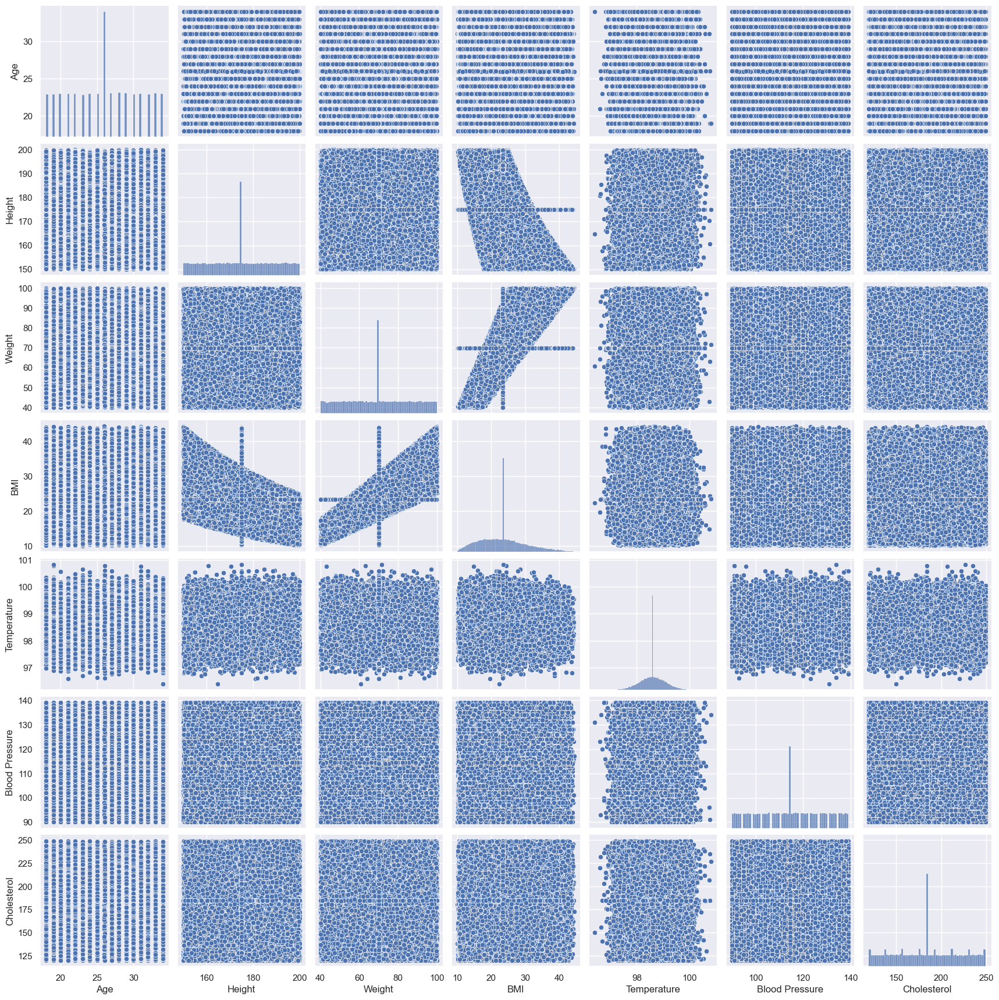

In [374]:
sns.pairplot(X_train)

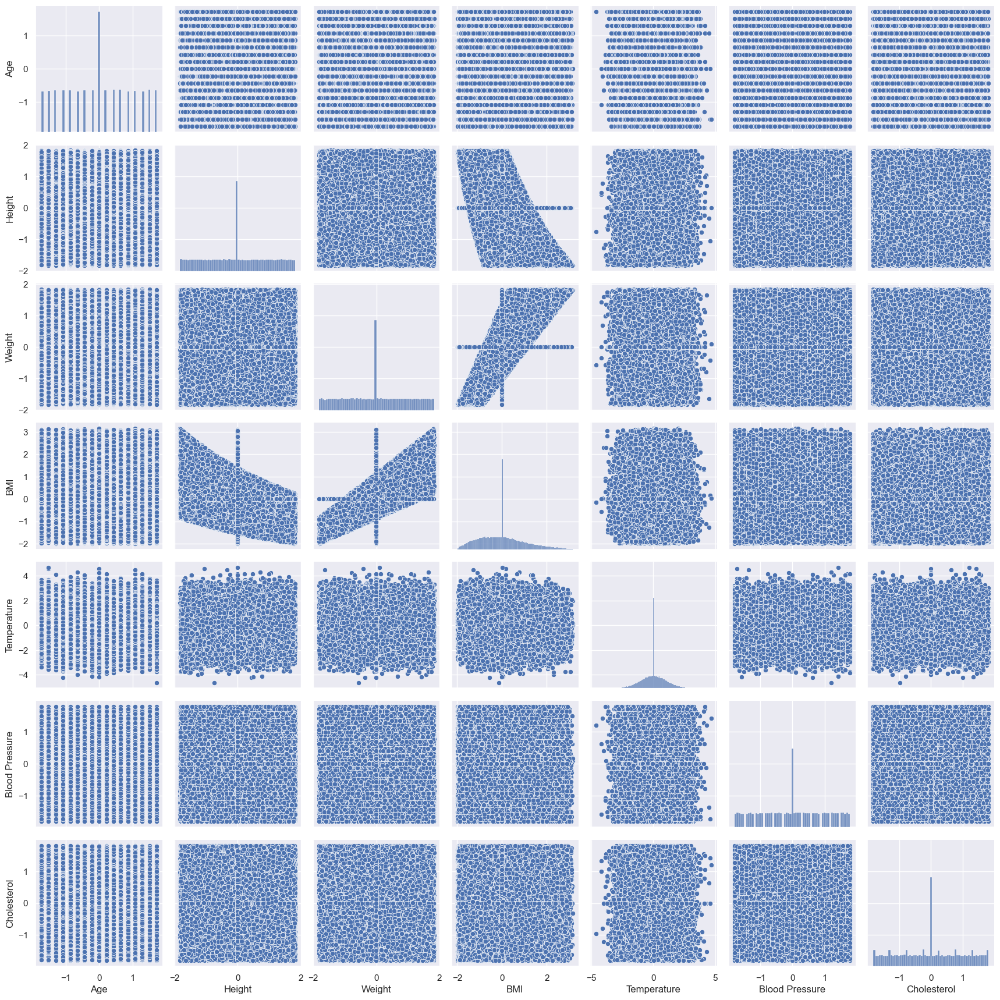

In [375]:
sns.pairplot(X_train_sc)

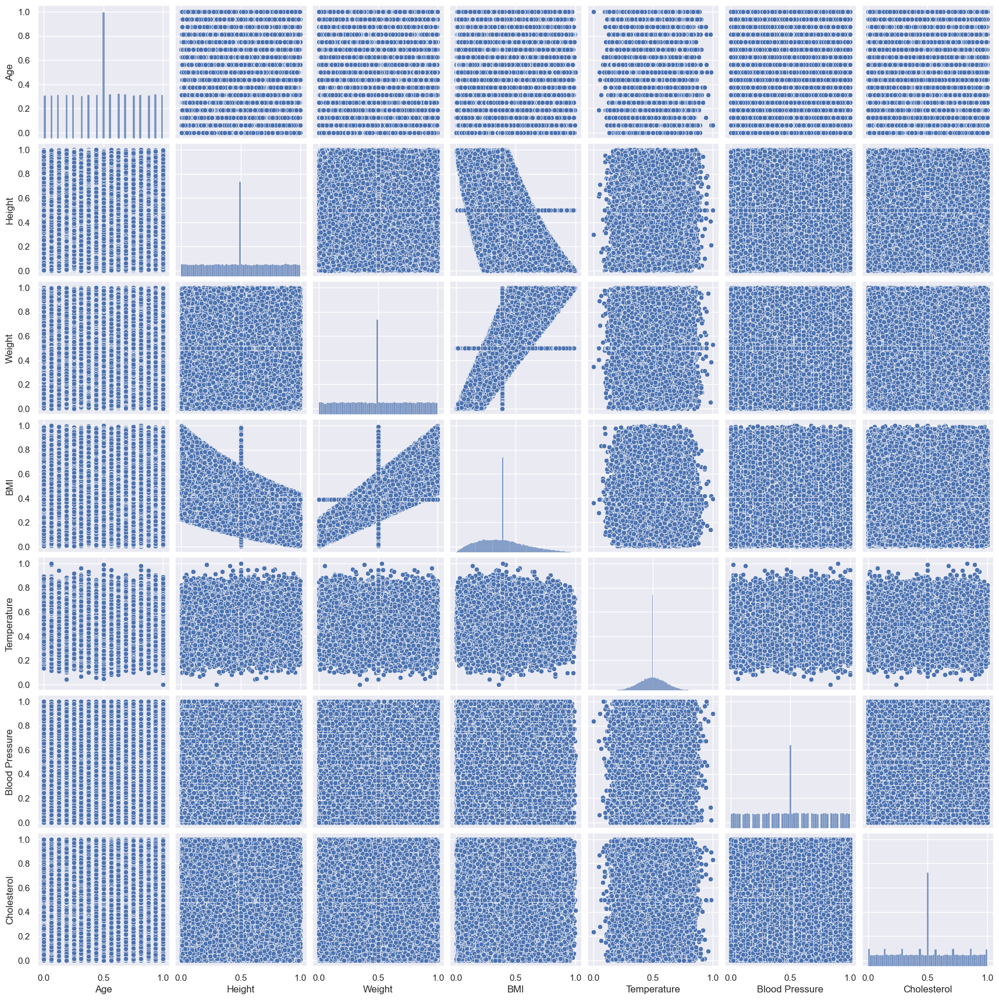

In [376]:
sns.pairplot(X_train_mmc)